In [2]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import pandas_profiling 
import matplotlib.pyplot as plt
import sklearn 
import xgboost as xgb
import pickle
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn import model_selection
from sklearn import svm
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from pandas_profiling import ProfileReport
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist  
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

# <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> PART-A

**DOMAIN**: Semiconductor manufacturing process

**CONTEXT**: A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of
signals/variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a
speci ic monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise.
Engineers typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then
feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key
factors contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to
learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and
trying out different combinations of features, essential signals that are impacting the yield type can be identified.

**DATA DESCRIPTION**: sensor-data.csv : (1567, 592)
The data consists of 1567 datapoints each with 591 features.
The dataset presented in this case represents a selection of such features where each example represents a single production entity with
associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to
a pass and “1” corresponds to a fail and the data time stamp is for that speci ic test point.

**PROJECT OBJECTIVE**: We will build a classi ier to predict the Pass/Fail yield of a particular process entity and analyse whether all the
features are required to build the model or not.

## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 1. Import and understand the data.

**<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 1.A Import ‘signal-data.csv’ as DataFrame.**

In [74]:
signal_data = pd.read_csv('signal-data.csv')
signal_data.head(10)

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5287,...,44.0077,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077,-1
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.5816,...,NaN,0.5010,0.0143,0.0042,2.8515,0.0342,0.0151,0.0052,44.0077,-1
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5153,...,95.0310,0.4984,0.0106,0.0034,2.1261,0.0204,0.0194,0.0063,95.0310,-1
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5358,...,111.6525,0.4993,0.0172,0.0046,3.4456,0.0111,0.0124,0.0045,111.6525,-1
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5381,...,90.2294,0.4967,0.0152,0.0038,3.0687,0.0212,0.0191,0.0073,90.2294,-1


**<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 1.B. Print 5 point summary and share at least 2 observations.**

In [75]:
signal_data.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1561.0,3014.452896,73.621787,2743.2400,2966.260000,3011.4900,3056.6500,3356.3500
1,1560.0,2495.850231,80.407705,2158.7500,2452.247500,2499.4050,2538.8225,2846.4400
2,1553.0,2200.547318,29.513152,2060.6600,2181.044400,2201.0667,2218.0555,2315.2667
3,1553.0,1396.376627,441.691640,0.0000,1081.875800,1285.2144,1591.2235,3715.0417
4,1553.0,4.197013,56.355540,0.6815,1.017700,1.3168,1.5257,1114.5366
...,...,...,...,...,...,...,...,...
586,1566.0,0.021458,0.012358,-0.0169,0.013425,0.0205,0.0276,0.1028
587,1566.0,0.016475,0.008808,0.0032,0.010600,0.0148,0.0203,0.0799
588,1566.0,0.005283,0.002867,0.0010,0.003300,0.0046,0.0064,0.0286
589,1566.0,99.670066,93.891919,0.0000,44.368600,71.9005,114.7497,737.3048


#### Observation: 
<ol>
<li><span style="color:#228B22"> The data has a time stamp colum which has unredable format.
<li><span style="color:#228B22"> Some columns like column 5 and 13 has same value across the rows
<li><span style="color:#228B22"> Few columns are right and left skewed.

 ## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 2.Data cleansing:

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.A. Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature.

In [76]:
for col in (signal_data.drop(['Time'],axis=1)).columns:
    val = (signal_data[col].isnull().sum()/len(signal_data[col]))*100
    if val >= 20:
        signal_data = signal_data.drop([col],axis=1)
    else:
        signal_data[col] = signal_data[col].transform(lambda x: x.fillna(x.mean()))

In [77]:
signal_data.head(10)

,Time,0,1,2,3,4,5,6,7,8,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5287,...,13.7755,0.4949,0.0189,0.0044,3.8276,0.034200,0.015100,0.005200,44.007700,-1
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.5816,...,8.3645,0.5010,0.0143,0.0042,2.8515,0.034200,0.015100,0.005200,44.007700,-1
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5153,...,16.0862,0.4984,0.0106,0.0034,2.1261,0.020400,0.019400,0.006300,95.031000,-1
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5358,...,14.2892,0.4993,0.0172,0.0046,3.4456,0.011100,0.012400,0.004500,111.652500,-1
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5381,...,7.4181,0.4967,0.0152,0.0038,3.0687,0.021200,0.019100,0.007300,90.229400,-1


In [78]:
signal_data.isnull().any().any()

False

In [79]:
signal_data.shape

(1567, 560)

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.B. Identify and drop the features which are having same value for all the rows.

In [80]:
for col in signal_data.drop(['Time'],axis=1).columns:
    if signal_data[col].nunique() == 1:
        signal_data = signal_data.drop([col],axis=1)

In [81]:
signal_data.shape

(1567, 444)

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.C. Drop other features if required using relevant functional knowledge. Clearly justify the same.

In [82]:
#dropping/ignoring time_stamp 
signal_data = signal_data.drop('Time', axis=1)

In [84]:
signal_data

,0,1,2,3,4,6,7,8,9,10,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.500500,0.016200,-0.003400,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.496600,-0.000500,-0.014800,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.443600,0.004100,0.001300,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.488200,-0.012400,-0.003300,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.503100,-0.003100,-0.007200,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,82.2467,0.1248,1.342400,-0.004500,-0.005700,...,11.7256,0.4988,0.0143,0.0039,2.8669,0.006800,0.013800,0.004700,203.172000,-1
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,98.4689,0.1205,1.433300,-0.006100,-0.009300,...,17.8379,0.4975,0.0131,0.0036,2.6238,0.006800,0.013800,0.004700,203.172000,-1
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,99.4122,0.1208,1.462862,-0.000841,0.000146,...,17.7267,0.4987,0.0153,0.0041,3.0590,0.019700,0.008600,0.002500,43.523100,-1
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,98.7978,0.1213,1.462200,-0.007200,0.003200,...,19.2104,0.5004,0.0178,0.0038,3.5662,0.026200,0.024500,0.007500,93.494100,-1


<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.D. Check for multi-collinearity in the data and take necessary action.

#### Observation: 
<ol>
<li><span style="color:#228B22"> Afew pair of columns shows strong correlation.
<li><span style="color:#228B22"> Few columns also exhibit negative correlation.
<li><span style="color:#228B22"> The target column has a very weak correlation with most of the sensor data.

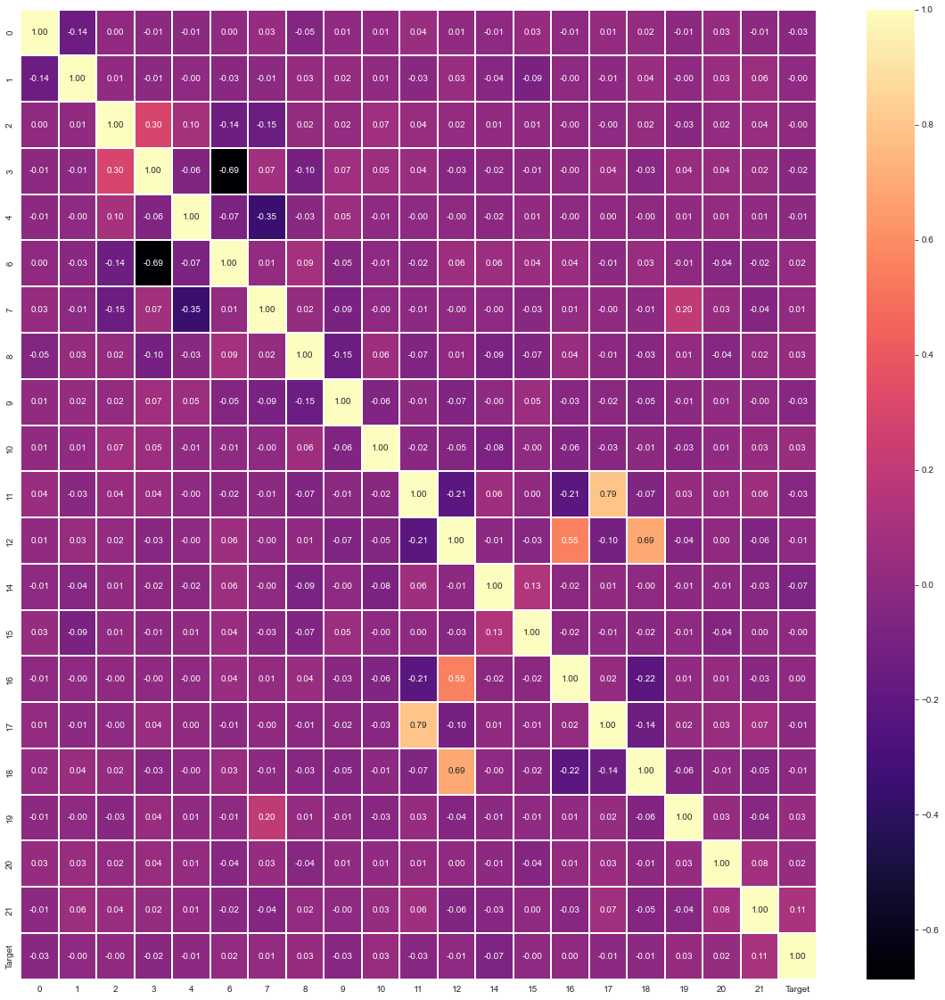

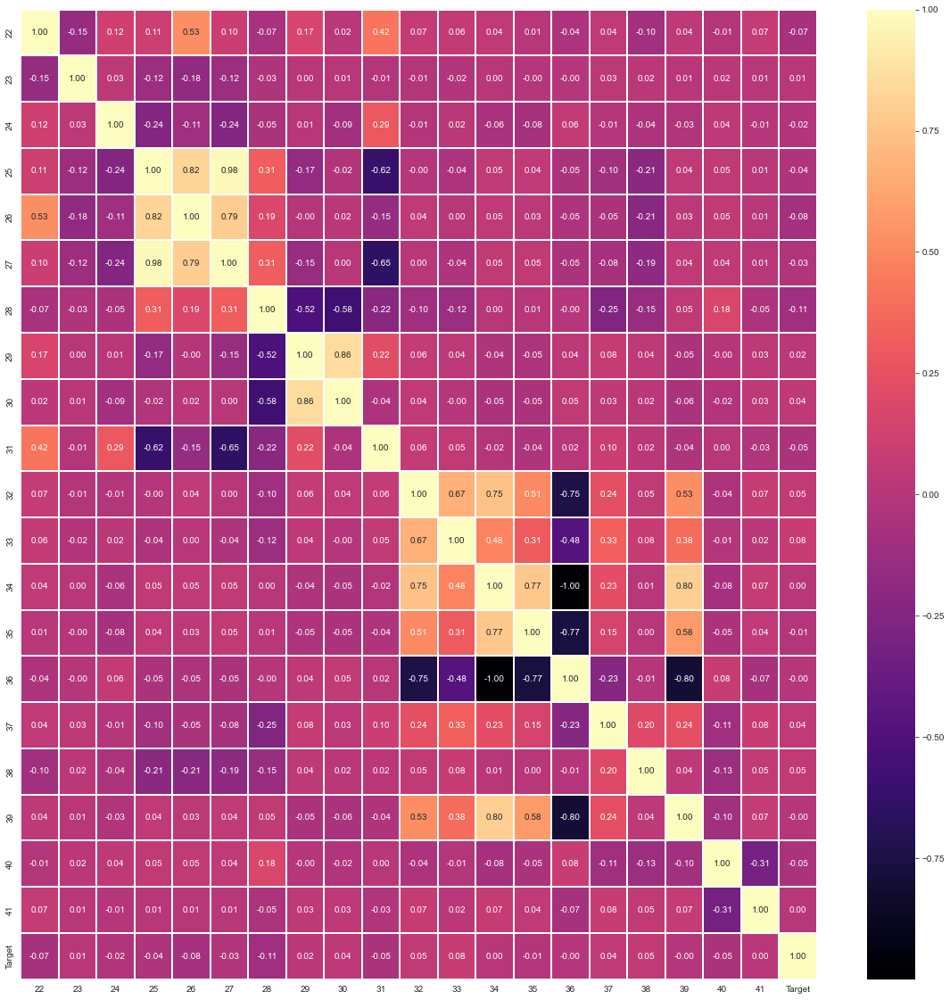

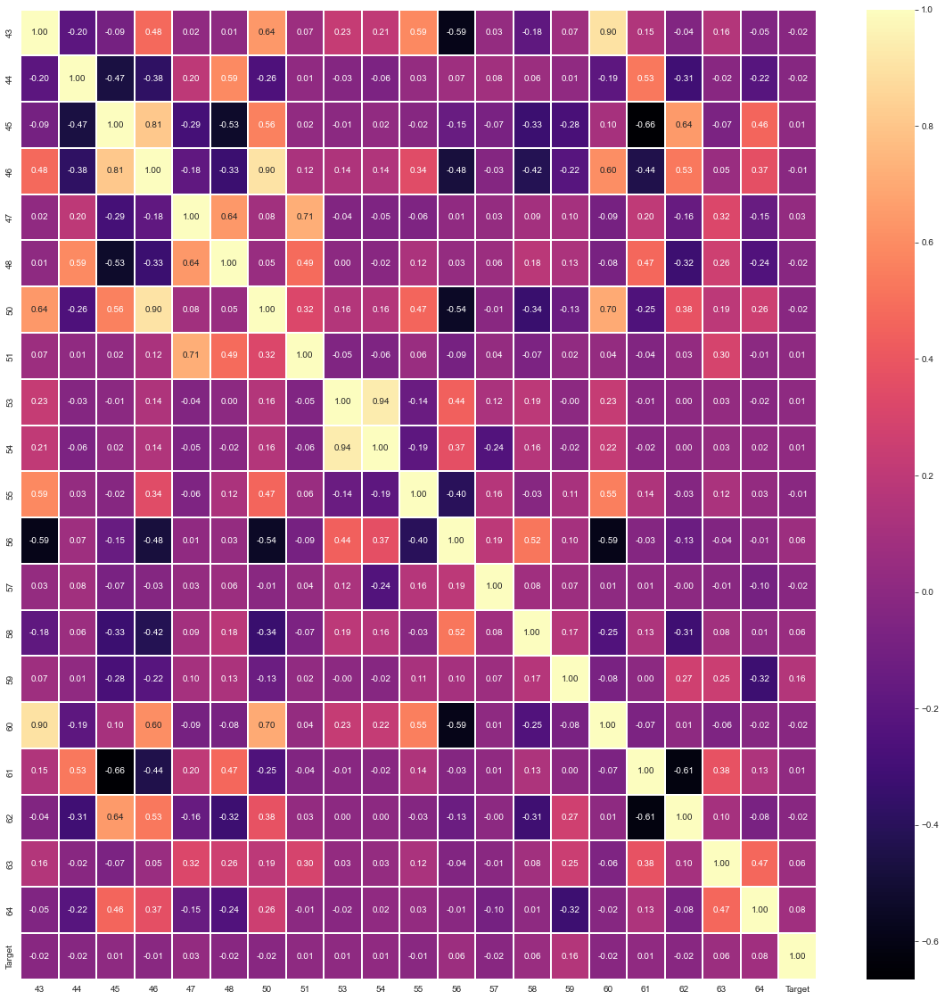

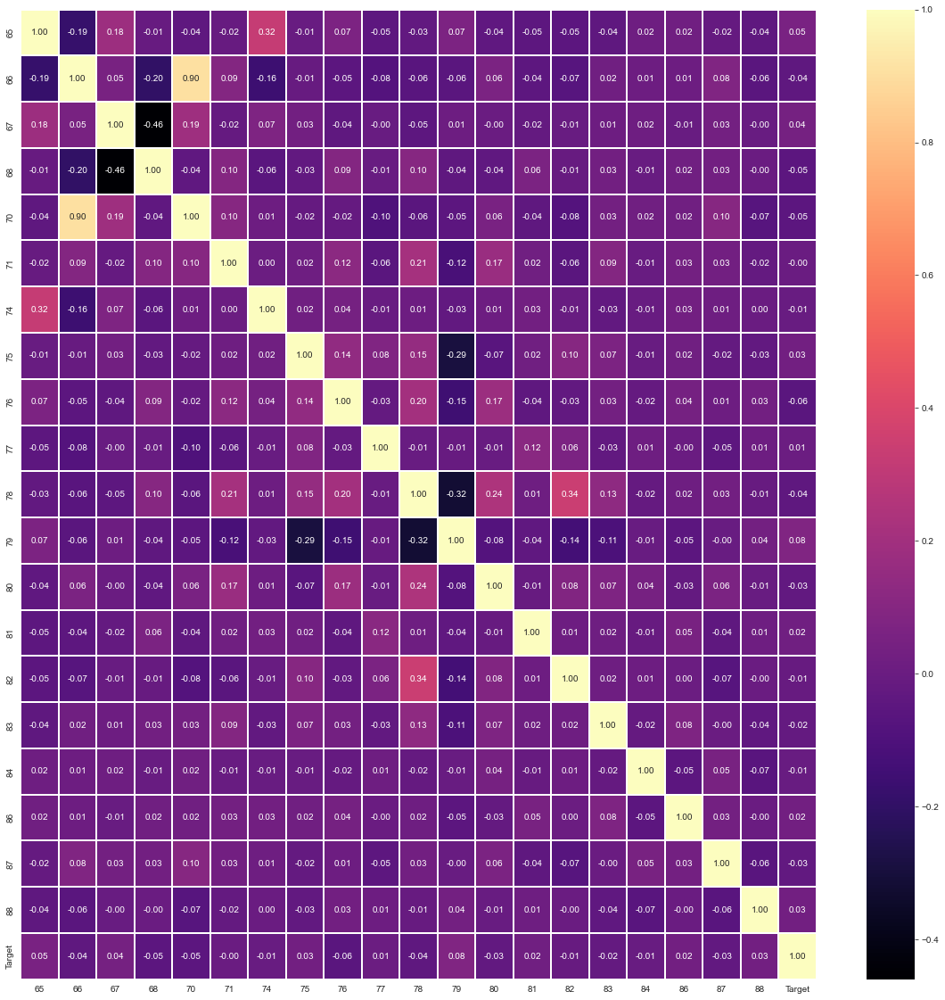

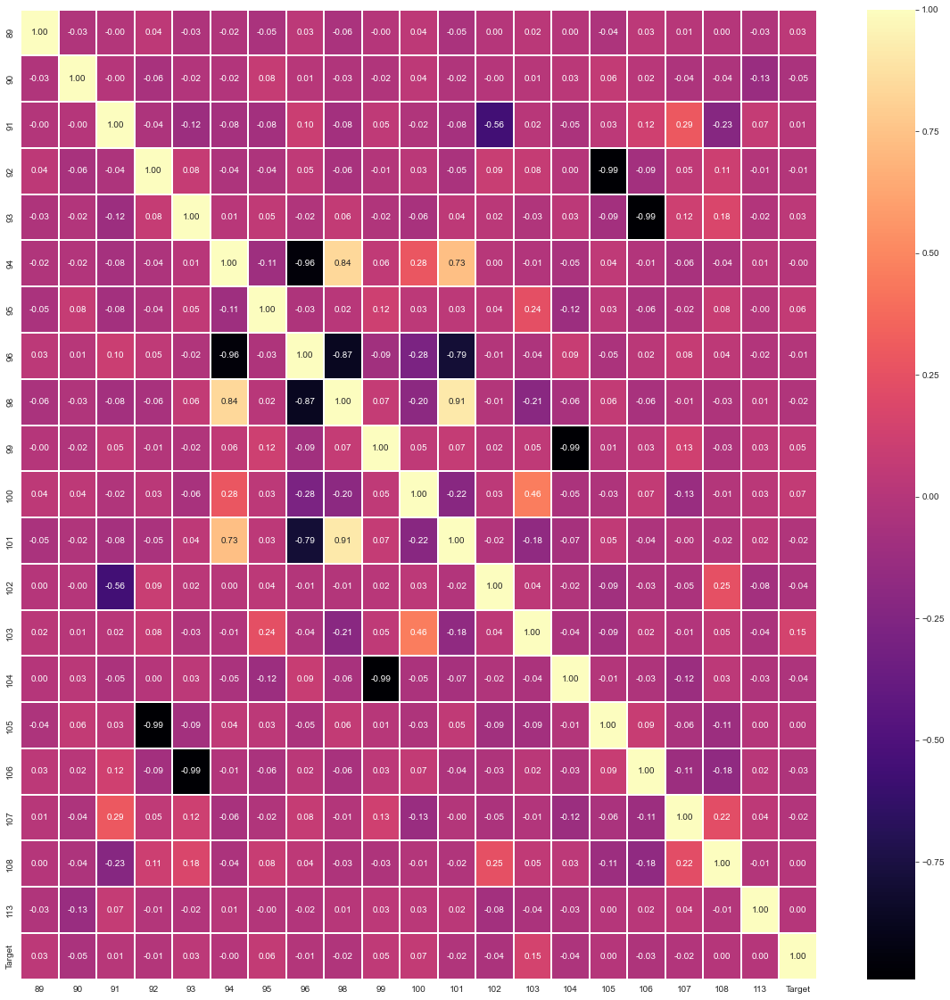

...

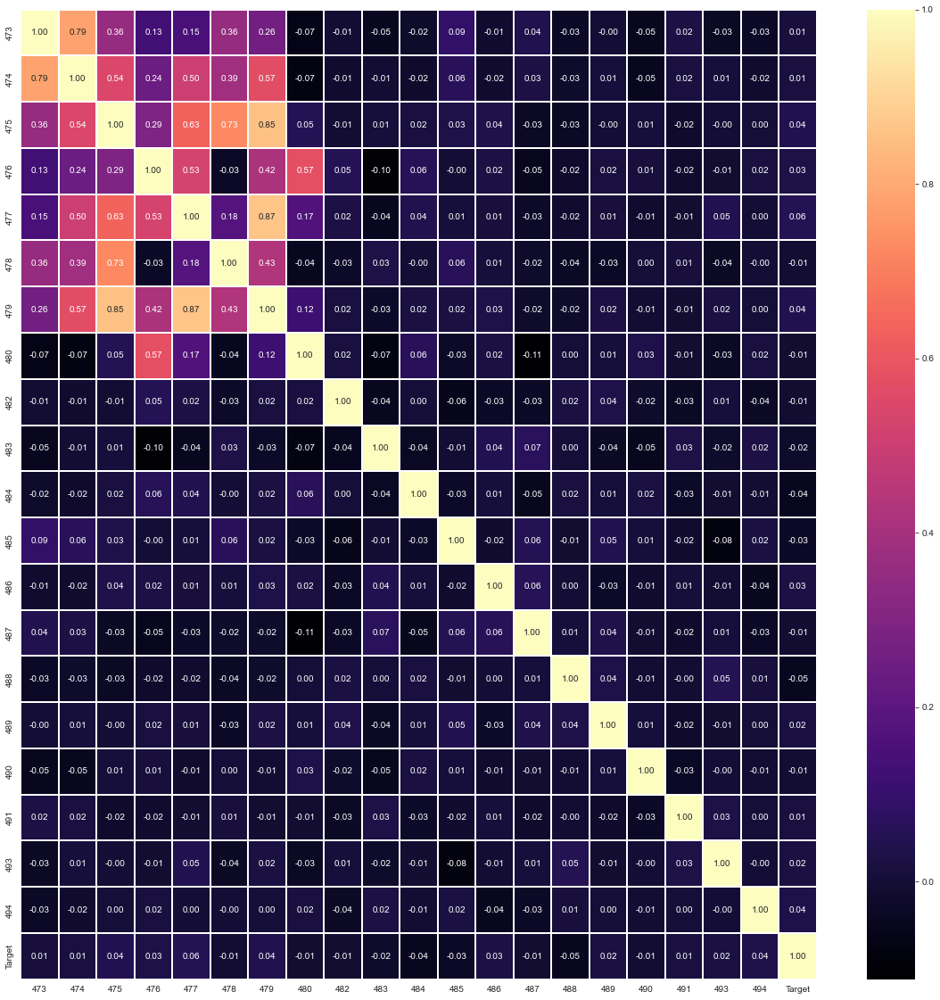

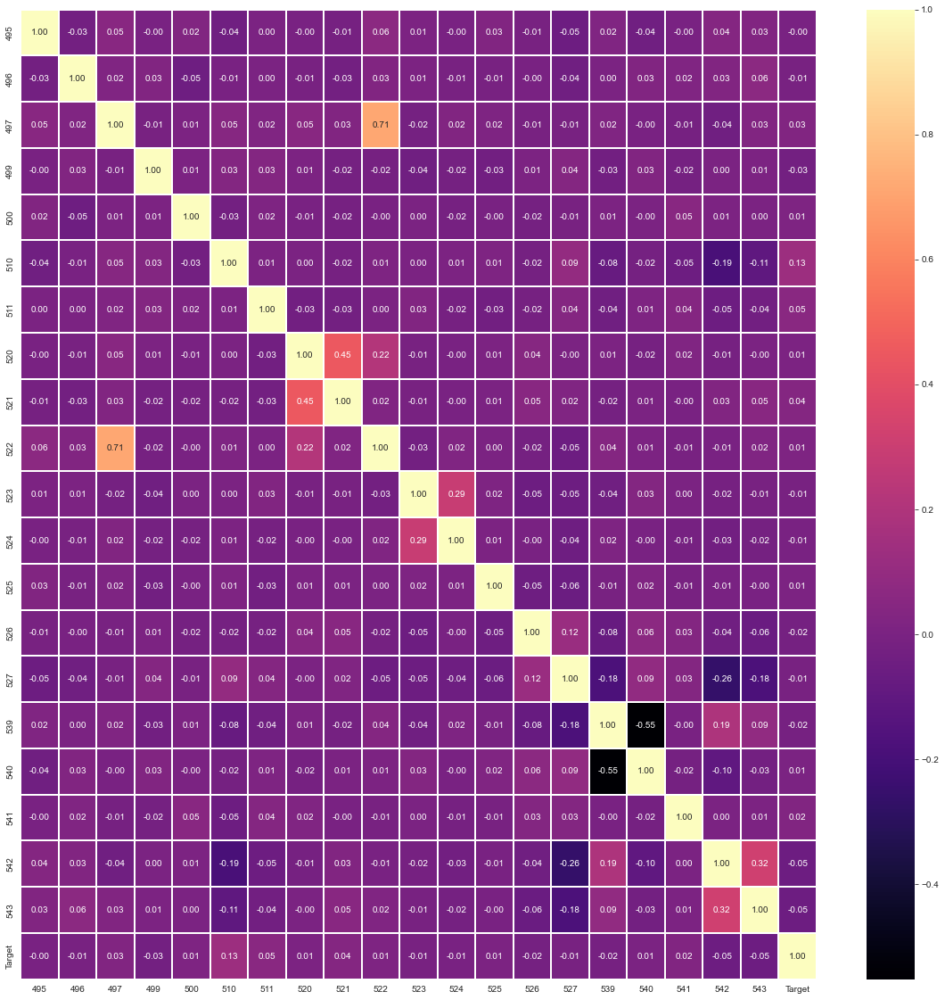

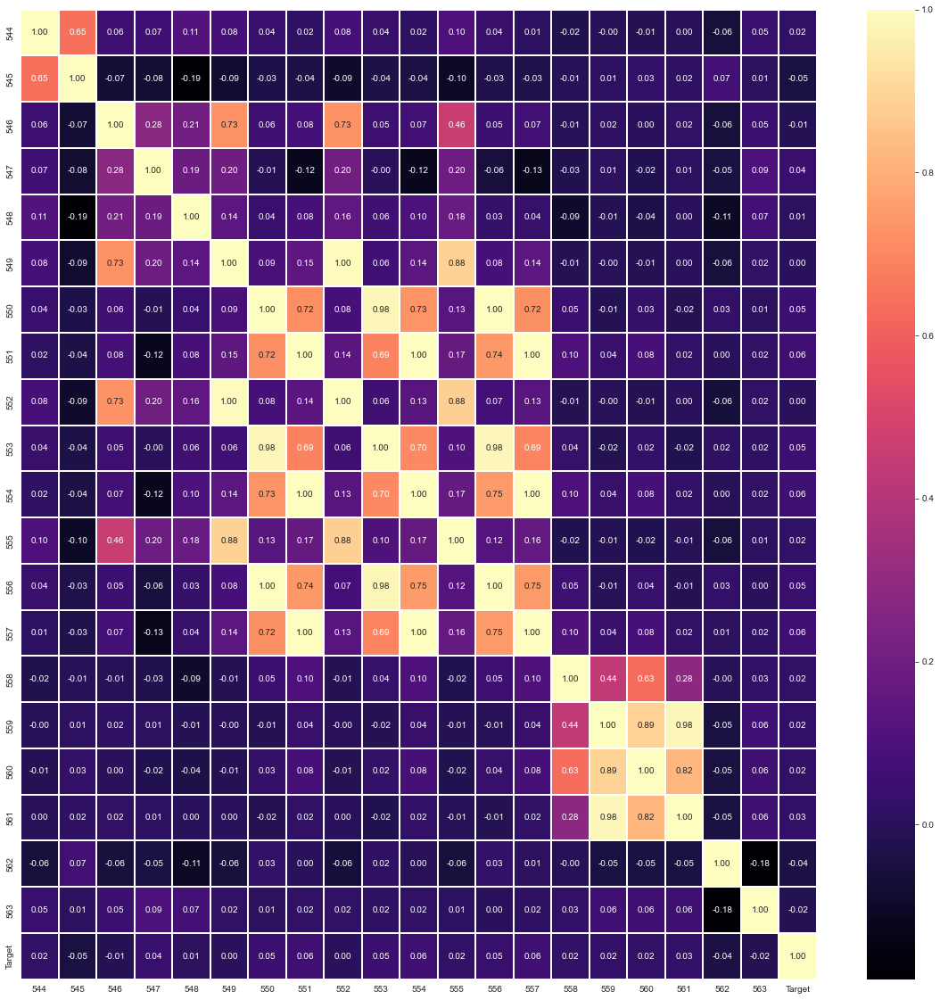

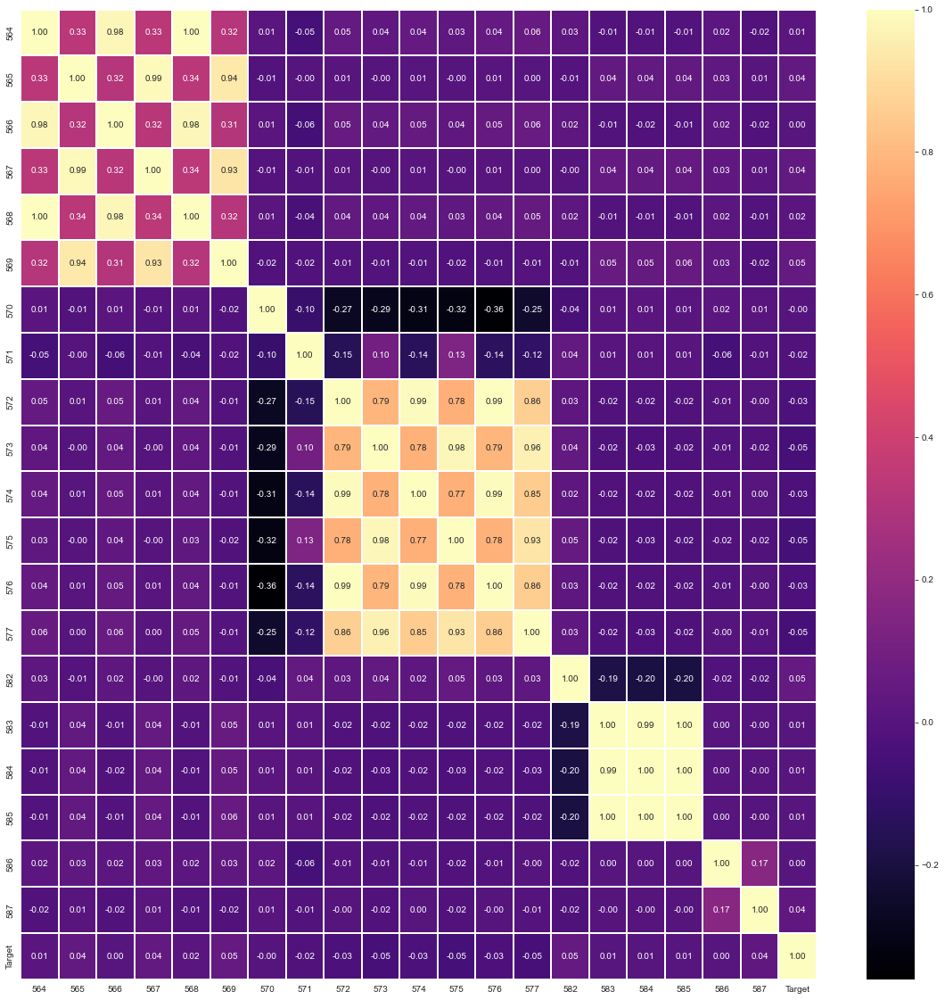

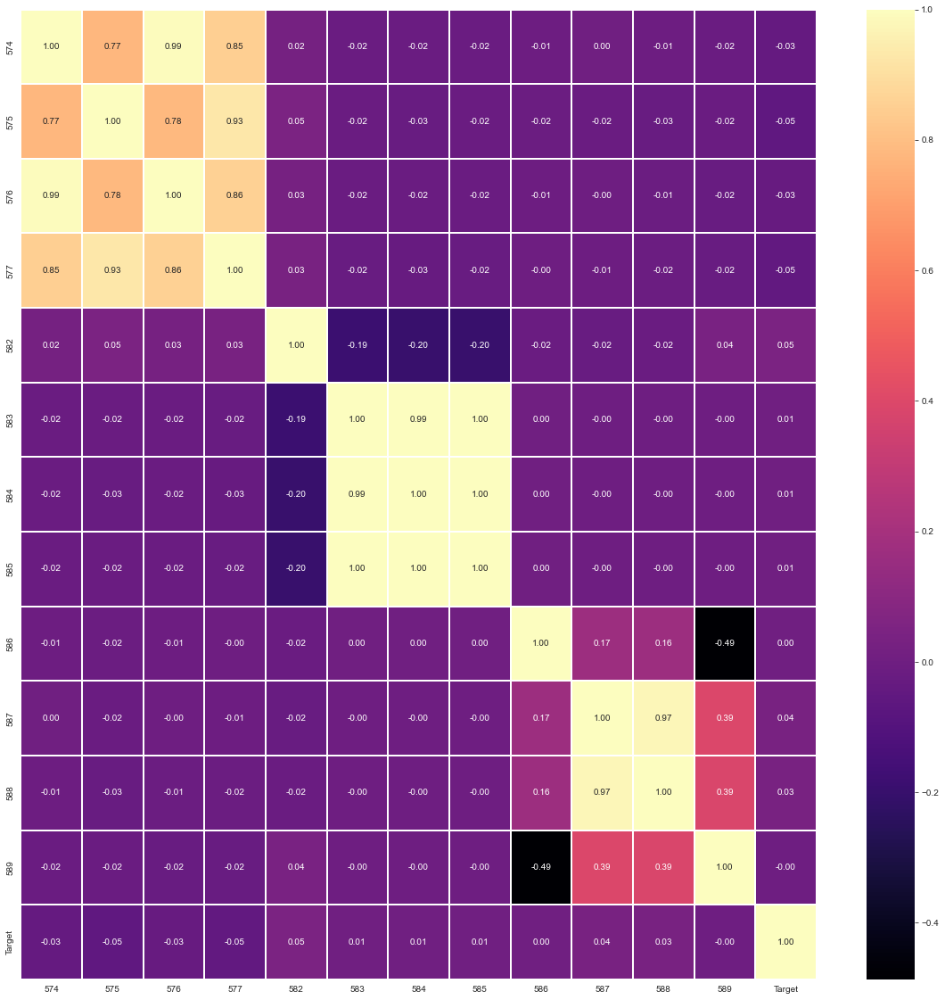

In [92]:
# Check the correlation between each attribute
for i in range (0, 440, 20):
    plot_data = signal_data.iloc[:, i:i+20]
    plot_data['Target'] = signal_data.iloc[:,442]
    fig,ax = plt.subplots(figsize=(20, 20))   
    sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
    plt.show()
plot_data = signal_data.iloc[:, 430:442]
plot_data['Target'] = signal_data.iloc[:,442]
fig,ax = plt.subplots(figsize=(20, 20))   
sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

In [116]:
#making a copy of the dataset and dropping the target class
data1=signal_data.copy()
data1.drop(['Pass/Fail'],axis=1,inplace=True)

In [117]:
# Create correlation matrix
corr_matrix = data1.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.70
to_drop = [column for column in upper.columns if any(upper[column] > 0.70)]

# Drop features 
data1.drop(to_drop, axis=1, inplace=True)

In [119]:
data1.head()

,0,1,2,3,4,6,7,8,9,10,...,564,565,570,571,572,582,583,586,587,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,6.444985,0.14561,533.8500,2.1113,8.95,0.5005,0.0118,0.021458,0.016475,99.670066
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,6.444985,0.14561,535.0164,2.4335,5.92,0.5019,0.0223,0.009600,0.020100,208.204500
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,1.100000,0.62190,535.0245,2.0293,11.21,0.4958,0.0157,0.058400,0.048400,82.860200
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,7.320000,0.16300,530.5682,2.0253,9.33,0.4990,0.0103,0.020200,0.014900,73.843200
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,6.444985,0.14561,532.0155,2.0275,8.83,0.4800,0.4766,0.020200,0.014900,73.843200


<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.E. Make all relevant modifications on the data using both functional/logical reasoning/assumptions

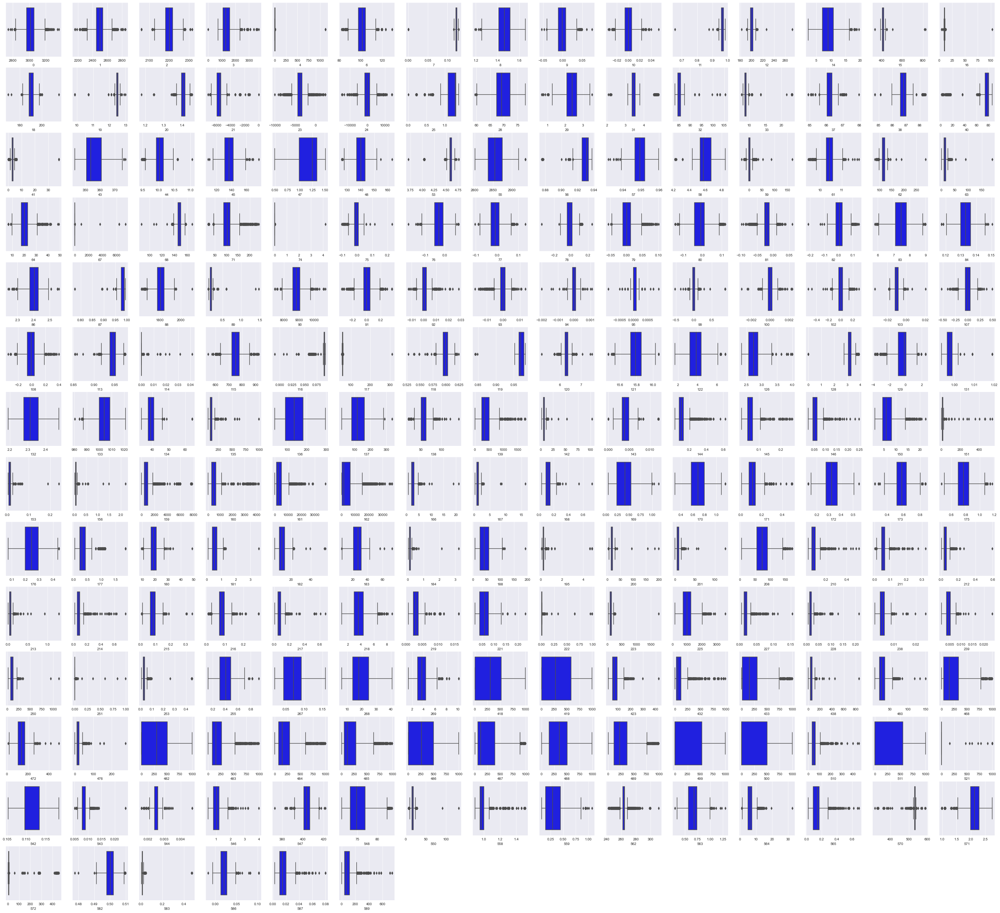

In [121]:
#Boxplot to check for outliers
plt.figure(figsize=(50, 50))
col = 1
for i in data1.columns:
    plt.subplot(15,15, col)
    sns.boxplot(data1[i],color='blue')
    col += 1

#### Observation: 
<ol>
<li><span style="color:#228B22"> Many attributes have outliers.
<li><span style="color:#228B22"> Replacing them with the median.

In [123]:
#find the outliers and replace them by median
for i in data1.columns:
    q1 = data1[i].quantile(0.25)
    q3 = data1[i].quantile(0.75)
    iqr = q3 - q1
    
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    
    data1.loc[(data1[i] < low) | (data1[i] > high), i] = data1[i].median()

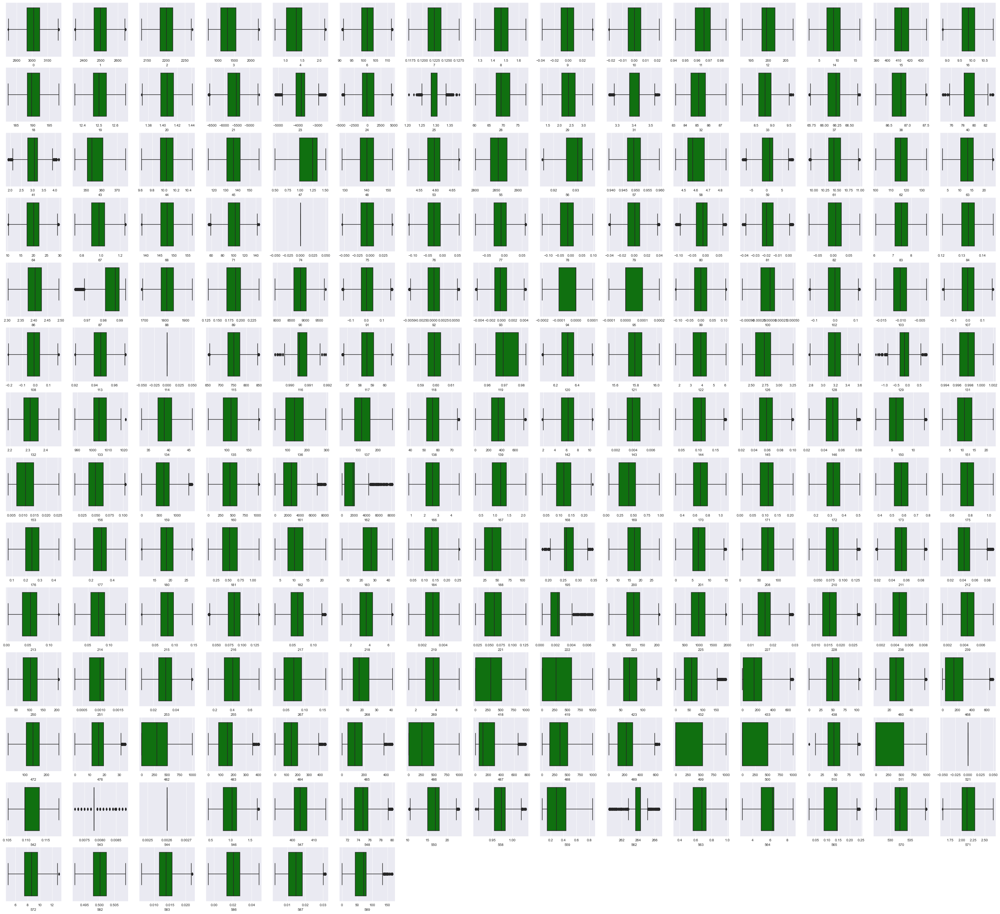

In [133]:
#After treating the outlier values
plt.figure(figsize=(50, 50))
col = 1
for i in data1.columns:
    plt.subplot(15,15, col)
    sns.boxplot(data1[i],color='green')
    col += 1

 ## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 3. Data analysis & visualisation:

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 3.A. Perform a detailed univariate Analysis with appropriate detailed comments after each analysis.

In [132]:
data1.shape

(1567, 201)

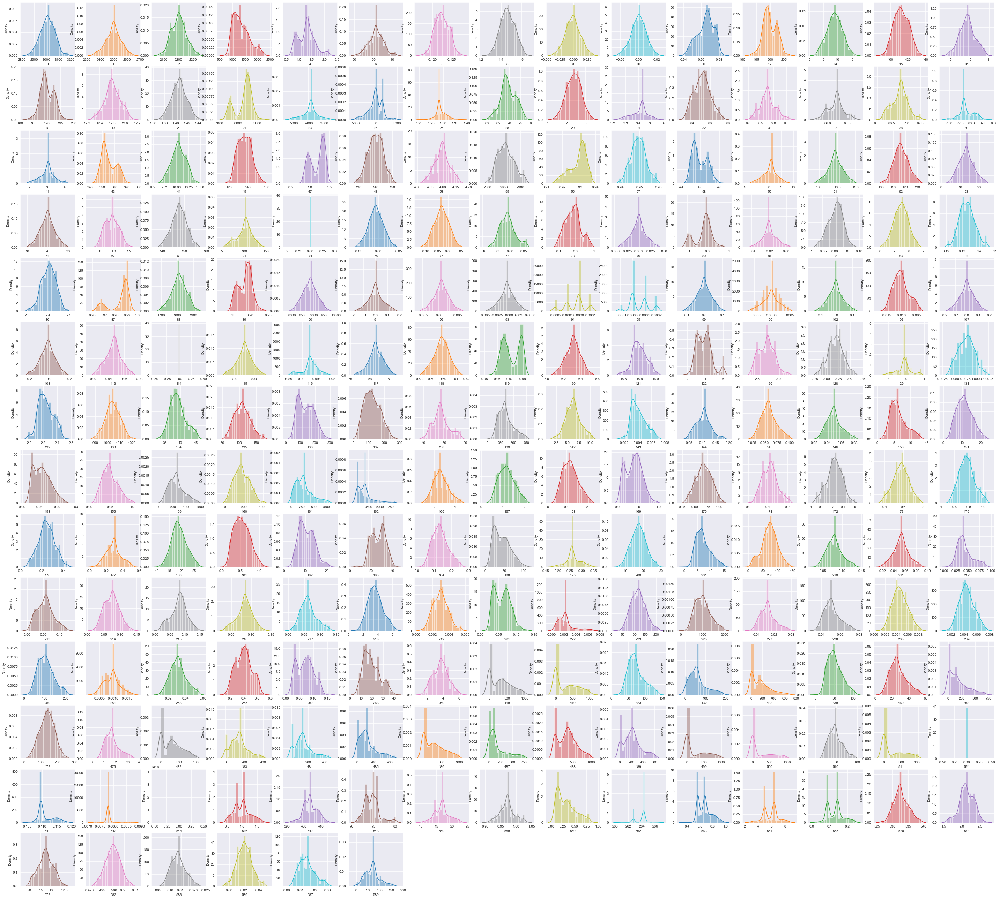

In [147]:
# Checking the univariate distribution of numerical columns
# fig, axs = plt.subplots(15,14, figsize=(20,50))
plt.figure(figsize=(50, 50))
colors = plt.rcParams["axes.prop_cycle"]()
axs=axs.flatten()
sns.set_color_codes()
col=1
for i in data1.columns:
    plt.subplot(15,15, col)
    sns.distplot(data1[i], color=next(colors)["color"], kde=True);
    col+=1

In [148]:
#combining the data
y=signal_data['Pass/Fail']
comb=pd.concat([data1,y],axis=1)

In [168]:
comb.iloc[:,201]

0      -1
1      -1
2       1
3      -1
4      -1
       ..
1562   -1
1563   -1
1564   -1
1565   -1
1566   -1
Name: Pass/Fail, Length: 1567, dtype: int64

#### Observation: 
<ol>
<li><span style="color:#228B22"> Most of the sensor data now is normally distributed except a few and the long tails have been removed.

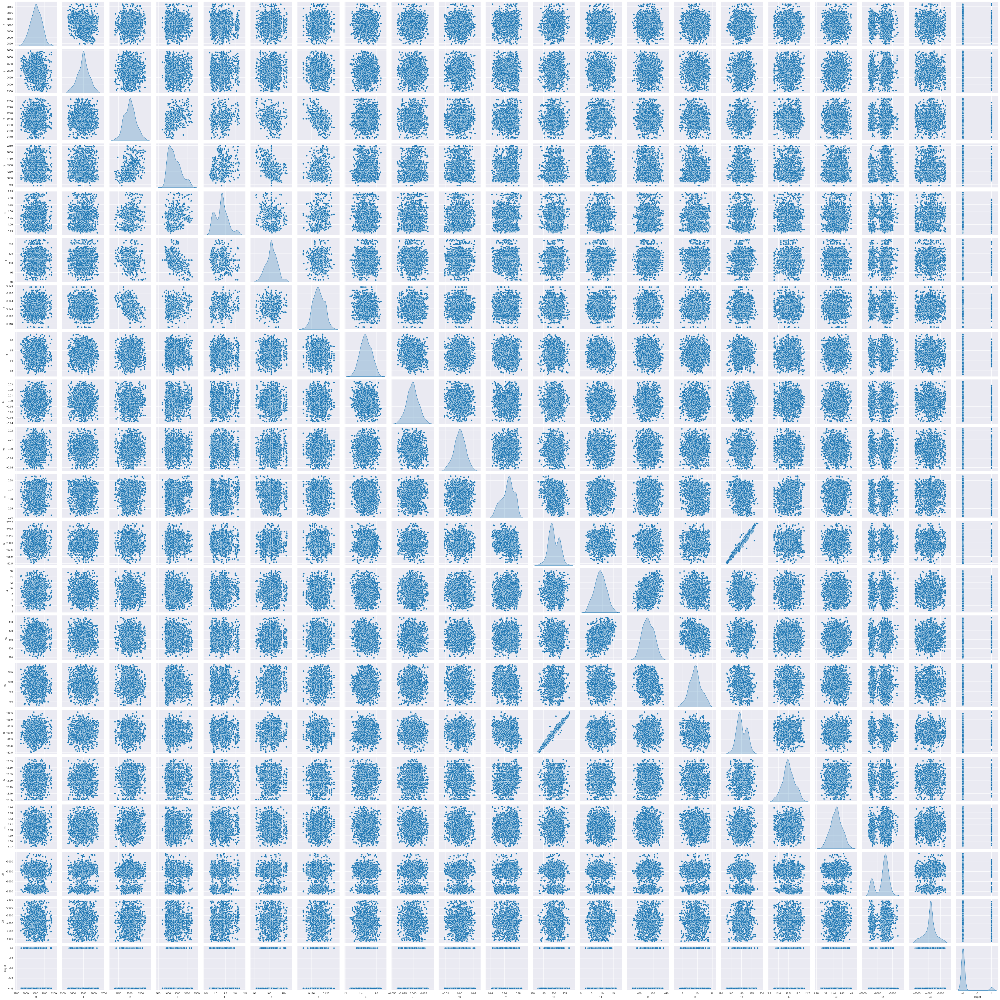

In [191]:
# A Scatter plot gives us an idea of the association between two variables
# Becasue of large number of columns we can perform bi-variate analysis of 20 columns at a time
plot_data = comb.iloc[:, 0:20]
plot_data['Target'] = comb.iloc[:,197]
sns.pairplot(plot_data, diag_kind='kde');

#### Observation: 
<ol>
<li><span style="color:#228B22"> The sensor data appears to have very little correlation and hence there is scope for dimensionality reduction is less.
<li><span style="color:#228B22"> The target vaiable appears to have weak correlation with many sensor data columns.
<li><span style="color:#228B22"> Since traget column is highly skewed we need to attempt upsampling 

In [179]:
#deleting columns with same values which was missed ealier
for col in comb.columns:
    if comb[col].nunique() == 1:
        comb = comb.drop([col],axis=1)

In [188]:
comb.iloc[:,197]

0      -1
1      -1
2       1
3      -1
4      -1
       ..
1562   -1
1563   -1
1564   -1
1565   -1
1566   -1
Name: Pass/Fail, Length: 1567, dtype: int64

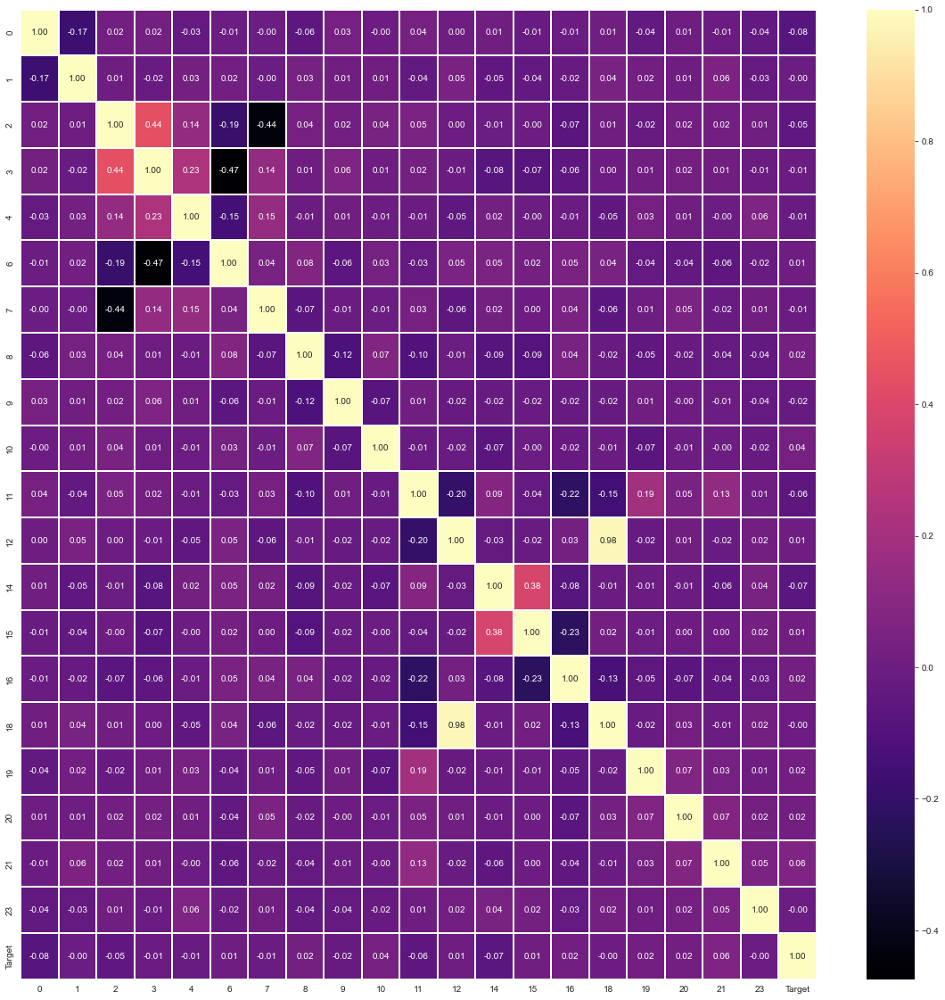

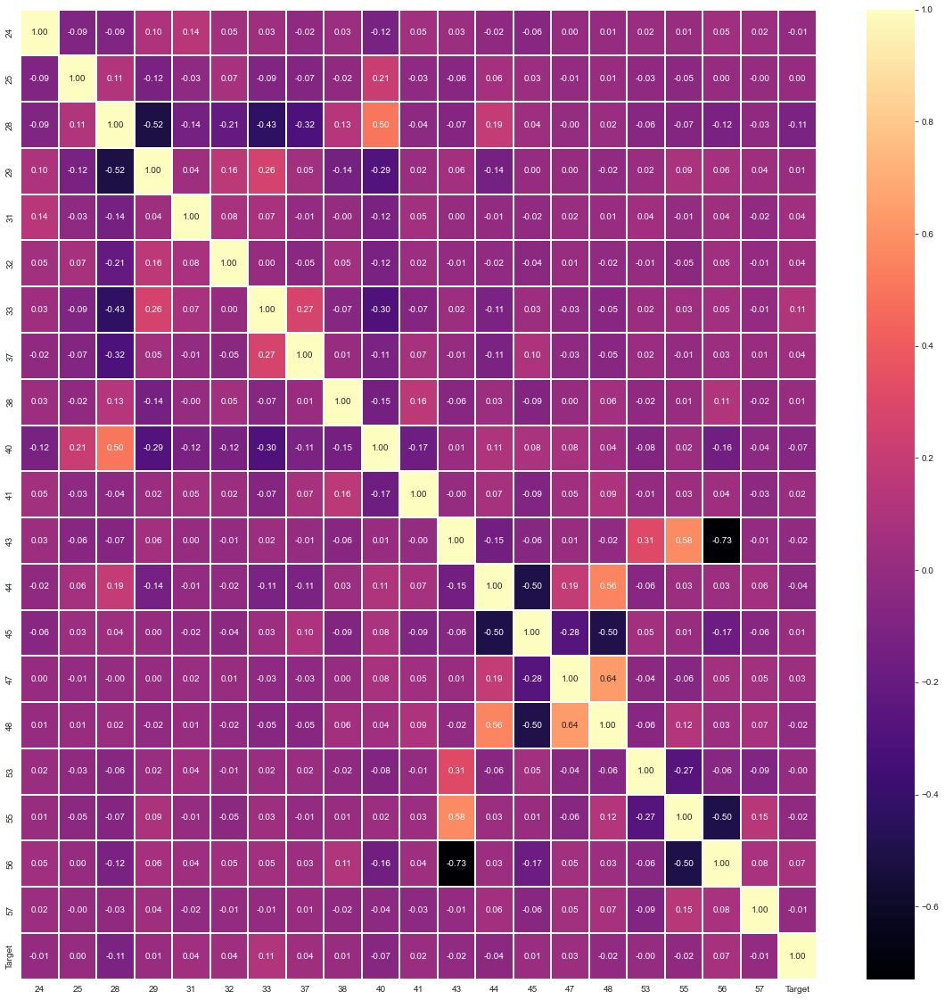

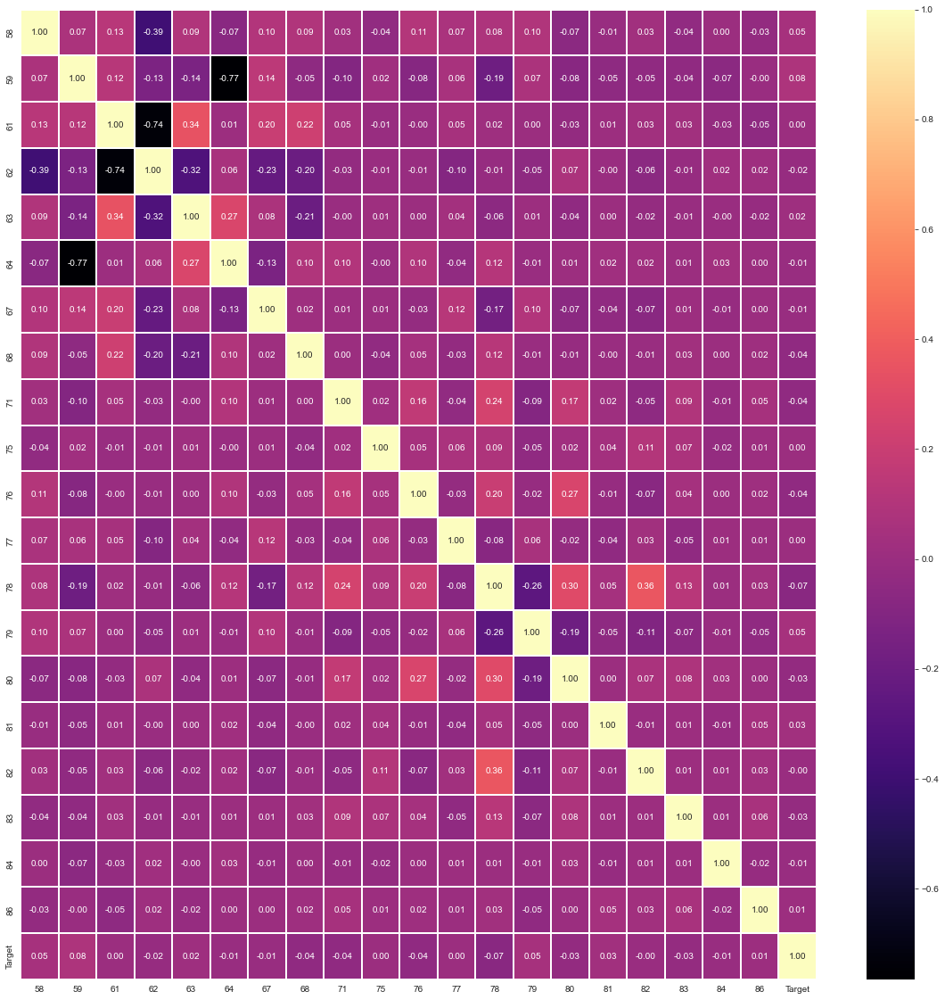

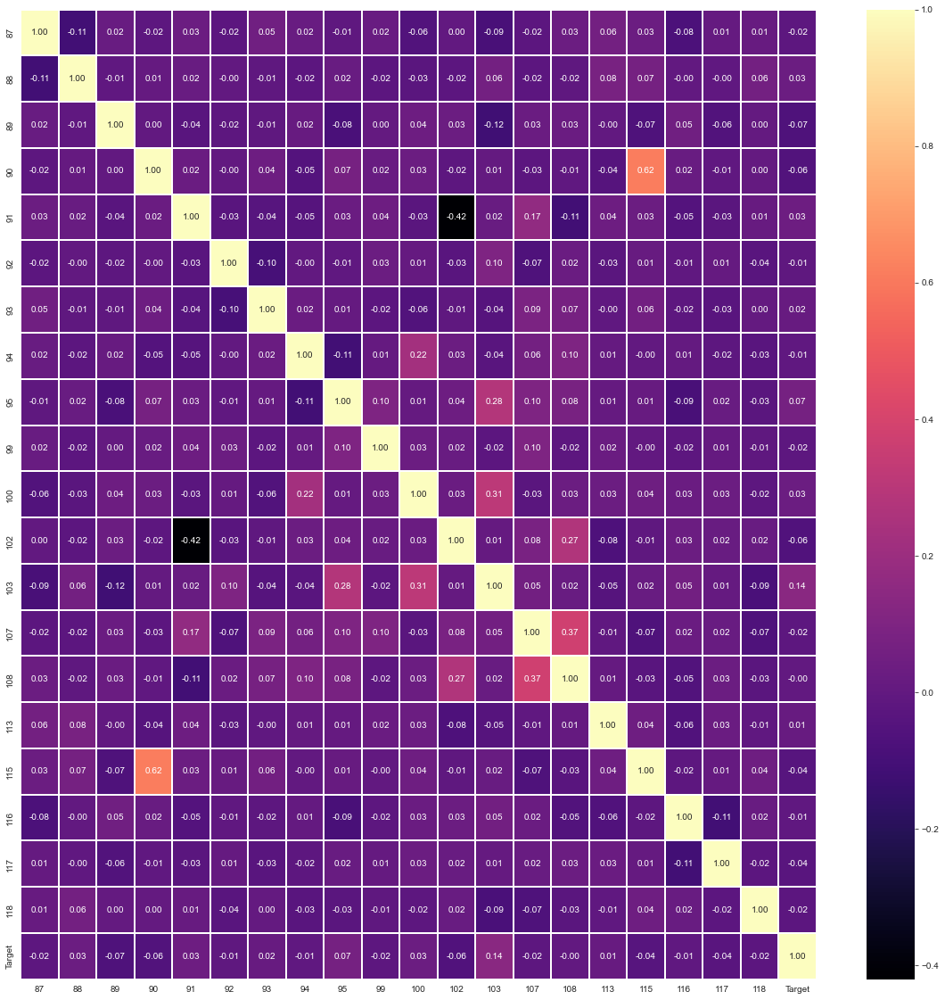

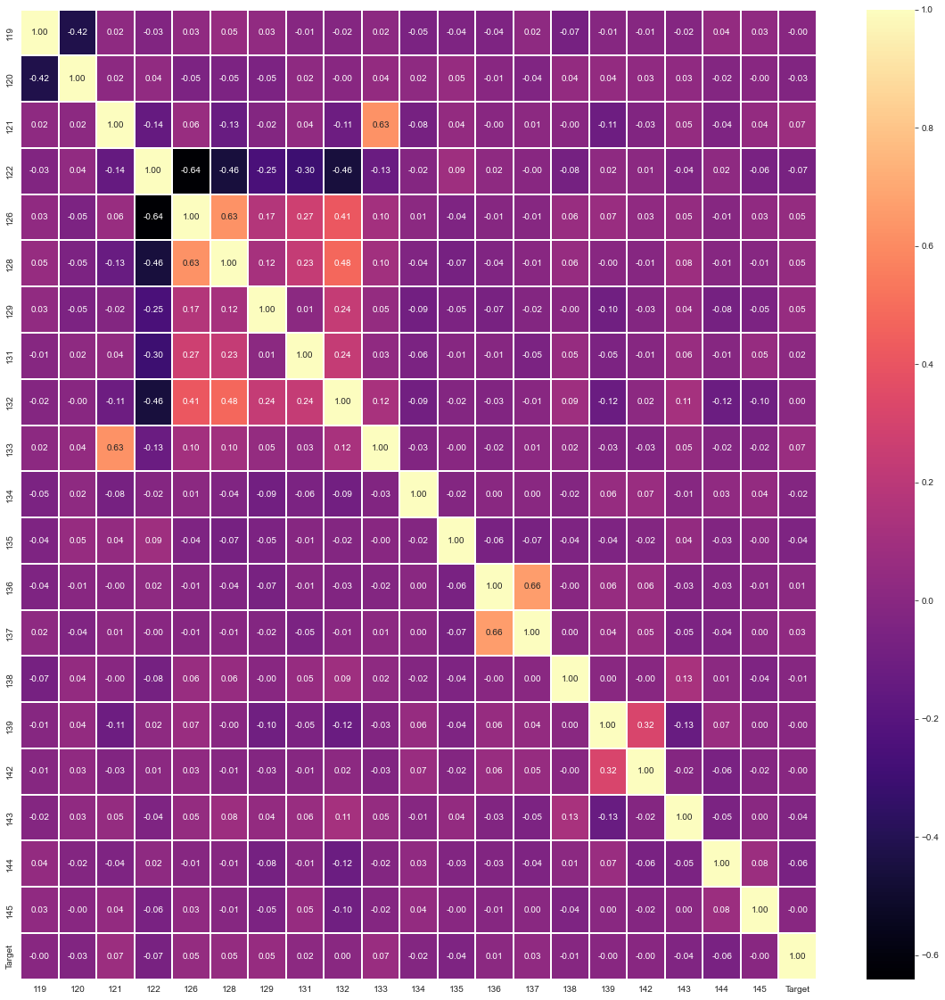

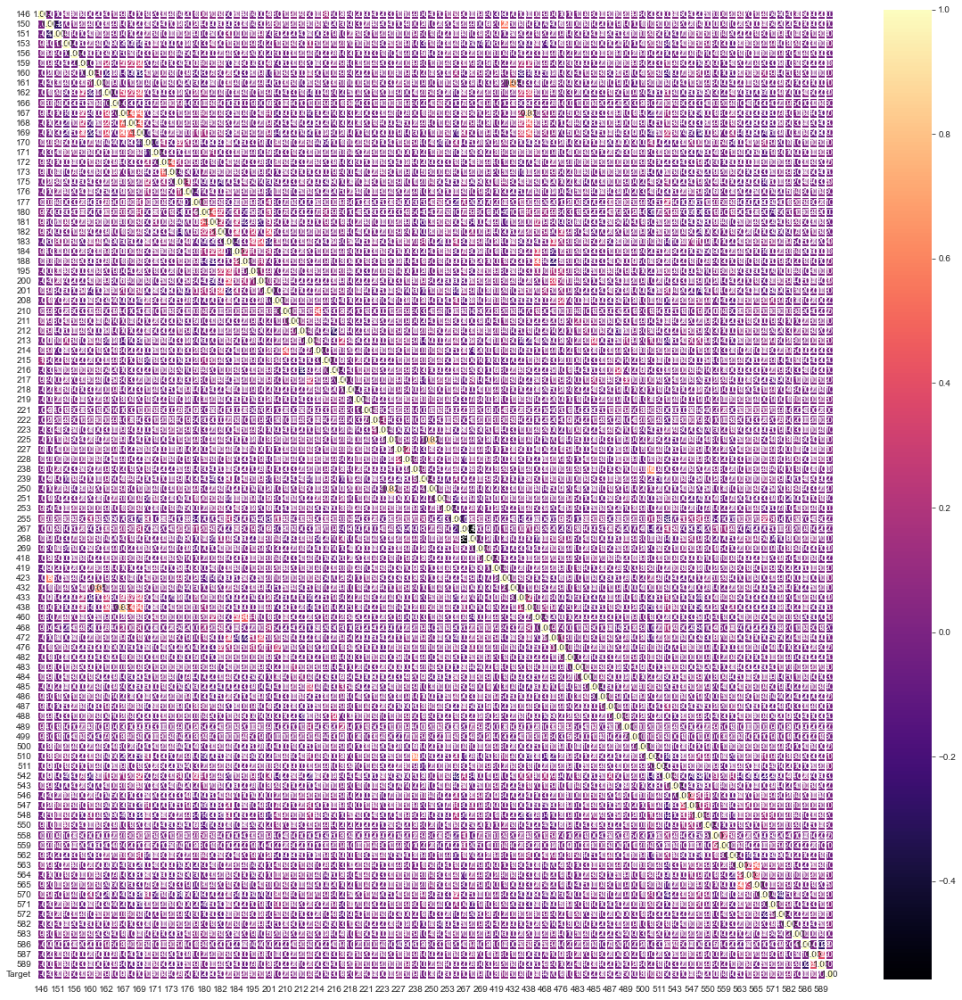

In [189]:
# Heat map for checking the multivariate analysis and correlation 
for i in range (0, 100, 20):
    plot_data = comb.iloc[:, i:i+20]
    plot_data['Target'] = comb.iloc[:,197]
    fig,ax = plt.subplots(figsize=(20, 20))   
    sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
    plt.show()
plot_data = comb.iloc[:, 100:197]
plot_data['Target'] = comb.iloc[:,197]
fig,ax = plt.subplots(figsize=(20, 20))   
sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

#### Observation: 
<ol>
<li><span style="color:#228B22"> A few pair of columns shows strong correlation.
<li><span style="color:#228B22"> Some columns also exhibit negative correlation.
<li><span style="color:#228B22"> The target column has a very weak correlation with most sensor data.

## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 4. Data pre-processing:

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 4.A. Segregate predictors vs target attributes.

In [204]:
comb.shape

(1567, 198)

In [205]:
from sklearn.model_selection import train_test_split
X = comb.iloc[:, :197]
y = comb.iloc[:, 197] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 4.B. Check for target balancing and fix it if found imbalanced

In [206]:
from imblearn.over_sampling import SMOTE

print("Before UpSampling, counts of label '-1': {}".format(sum(y_train==-1)))
print("Before UpSampling, counts of label '1': {} \n".format(sum(y_train==1)))

print('Before UpSampling, the shape of train_X: {}'.format(X_train.shape))
print('Before UpSampling, the shape of train_y: {} \n'.format(y_train.shape))

def smote(X, y):
    sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1) 
    X_res, y_res = sm.fit_resample(X, y.ravel())
    return X_res, y_res

X_train_upS, y_train_upS = smote(X_train, y_train)

print("After UpSampling, counts of label '-1': {}".format(sum(y_train_upS==-1)))
print("After UpSampling, counts of label '1': {} \n".format(sum(y_train_upS==1)))

print('After UpSampling, the shape of train_X: {}'.format(X_train_upS.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_upS.shape))

Before UpSampling, counts of label '-1': 1024
Before UpSampling, counts of label '1': 72 

Before UpSampling, the shape of train_X: (1096, 197)
Before UpSampling, the shape of train_y: (1096,) 

After UpSampling, counts of label '-1': 1024
After UpSampling, counts of label '1': 1024 

After UpSampling, the shape of train_X: (2048, 197)
After UpSampling, the shape of train_y: (2048,) 



<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 4.C. Perform train-test split and standardise the data or vice versa if required.

In [202]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer   

std_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
log_transformer = FunctionTransformer(np.log1p)

X_minmax = minmax_scaler.fit_transform(X, y)
X_std = std_scaler.fit_transform(X, y)
X_log = log_transformer.fit_transform(X_minmax, y)

X_train_minmax, X_test_minmax, y_train_minmax, y_test_minmax = train_test_split(X_minmax, y, test_size=0.3, random_state=1)
X_train_std, X_test_std, y_train_std, y_test_std = train_test_split(X_std, y, test_size=0.3, random_state=1)
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_log, y, test_size=0.3, random_state=1)

X_train_minmax_upS, y_train_upS = smote(X_train_minmax, y_train)
X_train_std_upS, y_train_upS = smote(X_train_std, y_train)
X_train_log_upS, y_train_upS = smote(X_train_log, y_train)

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 4.D. Check if the train and test data have similar statistical characteristics when compared with original data.

In [203]:
print('Before UpSampling, the mean of train_X: \n{}\n'.format(np.mean(X_train, axis=0)))
print('Before UpSampling, the mean of train_y: {} \n'.format(np.mean(y_train)))

print('After UpSampling, the mean of train_X: \n{}\n'.format(np.mean(X_train_upS, axis=0)))
print('After UpSampling, the mean of train_y: {} \n'.format(np.mean(y_train_upS)))



print('Before UpSampling, the standard deviation of train_X: \n{}\n'.format(np.std(X_train, axis=0)))
print('Before UpSampling, the standard deviation of train_y: {} \n'.format(np.std(y_train)))


print('After UpSampling, the standard deviation of train_X: \n{}\n'.format(np.std(X_train_upS, axis=0)))
print('After UpSampling, the standard deviation of train_y: {} \n'.format(np.std(y_train_upS)))

Before UpSampling, the mean of train_X: 
0      3008.737365
1      2497.079755
2      2201.438220
3      1342.867622
4         1.301187
          ...     
582       0.500008
583       0.013796
586       0.020568
587       0.014907
589      68.087315
Length: 197, dtype: float64

Before UpSampling, the mean of train_y: -0.8686131386861314 

After UpSampling, the mean of train_X: 
0      3001.757650
1      2499.661498
2      2198.627327
3      1335.406435
4         1.296566
          ...     
582       0.500175
583       0.013909
586       0.020846
587       0.015742
589      69.273879
Length: 197, dtype: float64

After UpSampling, the mean of train_y: 0.0 

Before UpSampling, the standard deviation of train_X: 
0       59.375149
1       57.026184
2       24.901571
3      328.684160
4        0.324954
          ...    
582      0.003206
583      0.003034
586      0.010292
587      0.006050
589     33.463274
Length: 197, dtype: float64

Before UpSampling, the standard deviation of train_y: 

## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 5. Model training, testing and tuning:

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.A. Use any Supervised Learning technique to train a model.

#### <font color=darkblue> Supervised Learning Model

In [209]:
model = LogisticRegression(solver="liblinear")

#### <font color=darkblue> Train the Model

In [210]:
def predict(input_type, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    print ("The accuracy of prediction for the {} input is {}".format(input_type, model.score(X_test, y_test)))
    return y_predict

y_predict_raw = predict("raw", X_train, y_train, X_test, y_test)
y_pred_minmax = predict("mimax scaled", X_train_minmax, y_train, X_test_minmax, y_test)
y_pred_std = predict("standardized", X_train_std, y_train, X_test_std, y_test)
y_pred_log = predict("minmax scaled and log trasformed", X_train_log, y_train, X_test_log, y_test)
y_pred_upS = predict("upsampled", X_train_upS, y_train_upS, X_test, y_test)
y_pred_minmax_upS = predict("upsampled and mimax scaled", X_train_minmax_upS, y_train_upS, X_test_minmax, y_test)
y_pred_std_upS = predict("upsampled and standardized", X_train_std_upS, y_train_upS, X_test_std, y_test)
y_pred_log_upS = predict("upsampled, minmax scaled and log trasformed", X_train_log_upS, y_train_upS, X_test_log, y_test)

The accuracy of prediction for the raw input is 0.9299363057324841
The accuracy of prediction for the mimax scaled input is 0.9341825902335457
The accuracy of prediction for the standardized input is 0.8959660297239915
The accuracy of prediction for the minmax scaled and log trasformed input is 0.9320594479830149
The accuracy of prediction for the upsampled input is 0.7600849256900213
The accuracy of prediction for the upsampled and mimax scaled input is 0.8131634819532909
The accuracy of prediction for the upsampled and standardized input is 0.7898089171974523
The accuracy of prediction for the upsampled, minmax scaled and log trasformed input is 0.8046709129511678


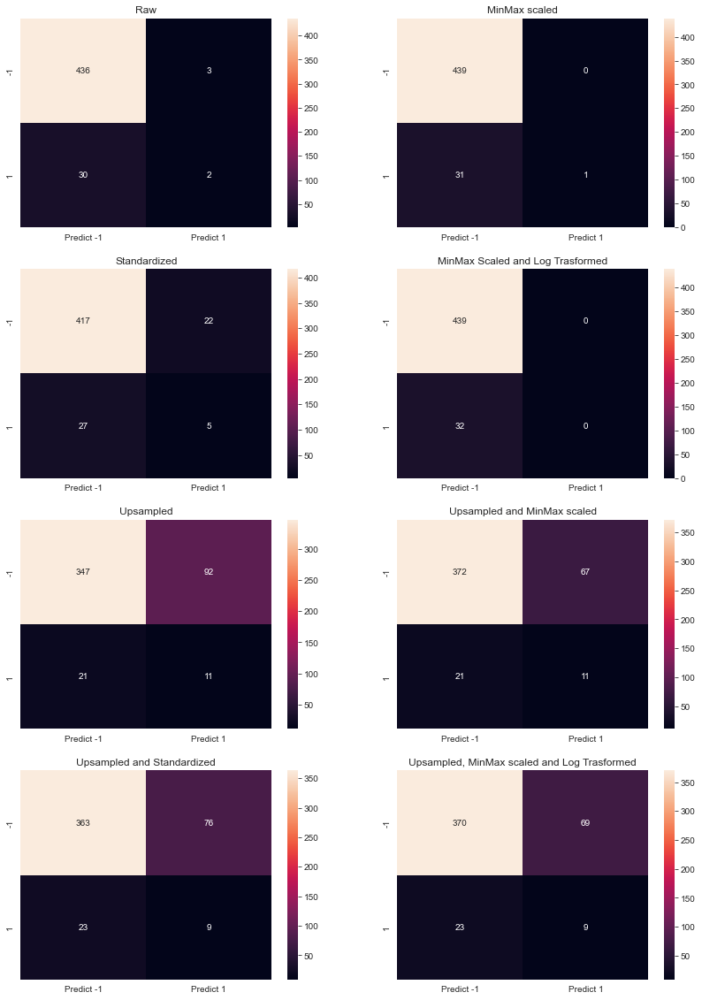

In [212]:
fig, axs = plt.subplots(4,2, figsize=(7*2,5*4))
axs=axs.flatten()
cases = { "Raw":y_predict_raw, 
         "MinMax scaled": y_pred_minmax,
         "Standardized": y_pred_std,
         "MinMax Scaled and Log Trasformed": y_pred_log, 
         "Upsampled":y_pred_upS, 
         "Upsampled and MinMax scaled":y_pred_minmax_upS, 
         "Upsampled and Standardized":y_pred_std_upS, 
         "Upsampled, MinMax scaled and Log Trasformed":y_pred_log_upS
        }

for i, (case, y_predict) in enumerate(cases.items()):
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[-1, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["-1","1"]],
                      columns = [i for i in ["Predict -1","Predict 1"]])
    axs[i].set_title(case)
    sns.heatmap(df_cm, annot=True, fmt='g', ax=axs[i]);

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.B. Use cross validation techniques.

In [213]:
from sklearn.model_selection import KFold
from sklearn.utils import resample # Bootstrap sampling
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

def kfold_accuracy(case, X, y):
    kfold = KFold(n_splits=20, random_state=1, shuffle=True)
    results = cross_val_score(model, X, y, cv=kfold)
    print("Kfold cross validation of " + case+ " input data gives mean accuracy of " "%.3f%%  with a standard deviation %.3f%%" % (results.mean()*100.0, results.std()*100.0))
    
kfold_accuracy("raw", X, y)
kfold_accuracy("minmax scaled", X_minmax, y)
kfold_accuracy("standardized", X_std, y)
kfold_accuracy("log transformed", X_log, y)

Kfold cross validation of raw input data gives mean accuracy of 92.724%  with a standard deviation 1.988%
Kfold cross validation of minmax scaled input data gives mean accuracy of 92.790%  with a standard deviation 2.293%
Kfold cross validation of standardized input data gives mean accuracy of 90.617%  with a standard deviation 2.435%
Kfold cross validation of log transformed input data gives mean accuracy of 93.109%  with a standard deviation 2.150%


In [220]:
def bootstrap_accuracy(case, data):
    n_iterations = 20
    n_size = int(len(comb) * 0.50)
    values=data.values

    stats = list()
    for i in range(n_iterations):
        train = resample(values, n_samples=n_size)
        test = np.array([x for x in values if x.tolist() not in train.tolist()])  
        model = LogisticRegression(solver="liblinear")
        model.fit(train[:,:-1], train[:,-1])
        predictions = model.predict(test[:,:-1])
        score = accuracy_score(test[:,-1], predictions)
        stats.append(score)
    stats = np.asarray(stats)
    print("Bootstrap cross validation of " + case+ " input data gives mean accuracy of " "%.3f%%  with a standard deviation %.3f%%" % (stats.mean()*100.0, stats.std()*100.0))
    return stats


signal_data_minmax = pd.DataFrame(data=np.column_stack((X_minmax, y.to_numpy())),
                                 index=comb.index,
                                 columns=comb.columns)

signal_data_std = pd.DataFrame(data=np.column_stack((X_std, y.to_numpy())),
                                 index=comb.index,
                                 columns=comb.columns)

signal_data_log = pd.DataFrame(data=np.column_stack((X_log, y.to_numpy())),
                                 index=comb.index,
                                 columns=comb.columns)

In [221]:
stats_raw = bootstrap_accuracy("raw", signal_data)
stats_minmax = bootstrap_accuracy("minmax scaled", signal_data_minmax)
stats_std = bootstrap_accuracy("standardized", signal_data_std)
stats_log = bootstrap_accuracy("log transformed", signal_data_log)

Bootstrap cross validation of raw input data gives mean accuracy of 87.336%  with a standard deviation 0.918%
Bootstrap cross validation of minmax scaled input data gives mean accuracy of 92.692%  with a standard deviation 0.446%
Bootstrap cross validation of standardized input data gives mean accuracy of 86.129%  with a standard deviation 1.290%
Bootstrap cross validation of log transformed input data gives mean accuracy of 93.244%  with a standard deviation 0.346%


<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.C Apply hyper-parameter tuning techniques to get the best accuracy

In [222]:
from sklearn.model_selection import GridSearchCV
model = LogisticRegression()

param_grid = [{'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
             'penalty':['l2']}, {'solver':['liblinear', 'saga'], 
                               'penalty':['l1']}]

gs = GridSearchCV(model,param_grid,cv=10)

gs.fit(X_train, y_train)
gs.best_params_

{'penalty': 'l2', 'solver': 'sag'}

In [225]:
#With different classifier
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier()

param_grid = {"max_depth": [3, None],
              "max_features": [1, 3, 10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

gs = GridSearchCV(model, param_grid=param_grid)
gs.fit(X_train, y_train)
gs.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 3,
 'max_features': 1,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [226]:
#With different search algorithm
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

model = RandomForestClassifier(n_estimators=50)

param_dist = {"max_depth": [3, None],
              "max_features": sp_randint(1, 11),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

randomCV = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10) 
randomCV.fit(X_train, y_train)
 
randomCV.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 1,
 'min_samples_leaf': 9,
 'min_samples_split': 6}

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.D Use any other technique/method which can enhance the model performance.

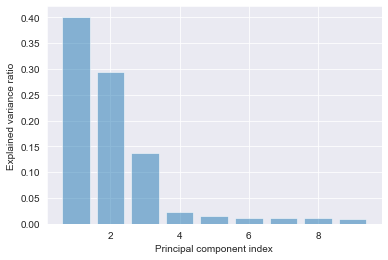

In [227]:
# Principal Component Analysis(PCA) for dimensionality reduction
from sklearn.decomposition import PCA
pca = PCA(n_components=9)
pca.fit(X_train)

plt.bar(list(range(1,10)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.show()

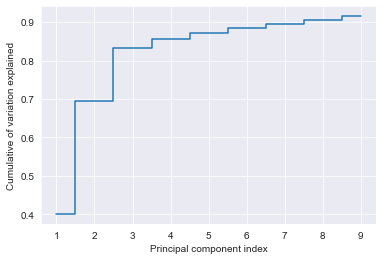

In [228]:
plt.step(list(range(1,10)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cumulative of variation explained')
plt.xlabel('Principal component index')
plt.show()

In [243]:
#Now lets experiment different dimensionality reduction, attribute removal, standardisation/normalisation, target balancing etc.
from imblearn.pipeline import Pipeline

pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 5, random_state=1)),
    ('scaler',StandardScaler()),
#     ('scaler', MinMaxScaler()),
#     ('scaler', FunctionTransformer(np.log1p)),
    ('pca', PCA(n_components=3)),
    ('clf', LogisticRegression(solver="sag", penalty= 'l2',random_state=1))
])

In [244]:
def score_matrix(pipe):
    pipe.fit(X_train,y_train)
    y_predict = pipe.predict(X_test)
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[-1, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["-1","1"]],
                      columns = [i for i in ["Predict -1","Predict 1"]])
    sns.heatmap(df_cm, annot=True, fmt='g');
    print(" Test score: {:.2f}". format( pipe.score( X_test, y_test)))

 Test score: 0.70


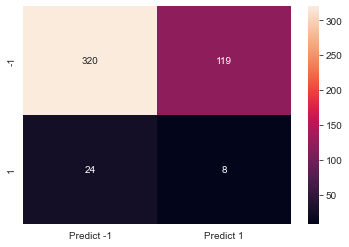

In [248]:
score_matrix(pipeline)

In [256]:
#Search for best parameters in pipeline

param_grid = {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6],'clf__solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']} 
grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5) 
grid.fit( X_train, y_train) 
y_pred = grid.predict(X_test)

print(" Best cross-validation accuracy: {:.2f}". format( grid.best_score_)) 
print(" Best parameters: ", grid.best_params_) 
print(" Test set accuracy: {:.2f}". format( grid.score( X_test, y_test)))

 Best cross-validation accuracy: 0.93
 Best parameters:  {'clf__solver': 'newton-cg', 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
 Test set accuracy: 0.93


<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.E Display and explain the classification report in detail.

In [261]:
from sklearn import metrics

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       439
           1       0.00      0.00      0.00        32

    accuracy                           0.93       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.87      0.93      0.90       471



<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5.F. Apply the above steps for all possible models that you have learnt so far.

In [265]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier


knn = KNeighborsClassifier(n_neighbors=5)
gnb = GaussianNB()
svc = SVC()
dtc = DecisionTreeClassifier()
# mlc = MLPClassifier()

classifier_set = { 'K Neighbors Classifier': knn,
      'Gaussian Naive Bayes': gnb,
      'Support Vector Classifier': svc,
      'Decision Tree Classifier': dtc
    }

for name, clf in classifier_set.items():
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])
    pipeline.fit(X_train,y_train) 
    y_pred = pipeline.predict(X_test)
    print ("Classification matrix for {} algorithm : ".format(name))
    
    report = pd.DataFrame(metrics.classification_report(y_test, 
                                        y_pred, digits=2,
                                        output_dict=True)).T
    report['support'] = report.support.apply(int)
    display(report)

Classification matrix for K Neighbors Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.942424,0.708428,0.808843,439
1,0.092199,0.406250,0.150289,32
accuracy,0.687898,0.687898,0.687898,0
macro avg,0.517311,0.557339,0.479566,471
weighted avg,0.884659,0.687898,0.764100,471


Classification matrix for Gaussian Naive Bayes algorithm : 


,precision,recall,f1-score,support
-1,0.930556,0.763098,0.838548,439
1,0.063063,0.218750,0.097902,32
accuracy,0.726115,0.726115,0.726115,0
macro avg,0.496809,0.490924,0.468225,471
weighted avg,0.871618,0.726115,0.788228,471


Classification matrix for Support Vector Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.939726,0.781321,0.853234,439
1,0.094340,0.312500,0.144928,32
accuracy,0.749469,0.749469,0.749469,0
macro avg,0.517033,0.546911,0.499081,471
weighted avg,0.882290,0.749469,0.805111,471


Classification matrix for Decision Tree Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.927273,0.697039,0.795839,439
1,0.056738,0.250000,0.092486,32
accuracy,0.666667,0.666667,0.666667,0
macro avg,0.492005,0.473519,0.444162,471
weighted avg,0.868128,0.666667,0.748053,471


In [266]:
lr = LogisticRegression()

bgc = BaggingClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()
rfc = RandomForestClassifier(n_estimators=50, random_state=1)


ensemble_set = { 
    'Bagging Classifier': bgc,
    'Adaaptive Boosting Classifier': abc,
    'Gradient Boosting Classifier': gbc,
    'Random Forest Classifier': rfc
}

for name, clf in ensemble_set.items():
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 5, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=4)),
    ('clf', clf)
    ])
    pipeline.fit(X_train,y_train) 
    y_pred = pipeline.predict(X_test)
    print ("Classification matrix for {} algorithm : ".format(name))
    
    report = pd.DataFrame(metrics.classification_report(y_test, 
                                        y_pred, digits=2,
                                        output_dict=True)).T
    report['support'] = report.support.apply(int)
    display(report)

Classification matrix for Bagging Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.943878,0.842825,0.890493,439
1,0.126582,0.312500,0.180180,32
accuracy,0.806794,0.806794,0.806794,0
macro avg,0.535230,0.577662,0.535337,471
weighted avg,0.888350,0.806794,0.842234,471


Classification matrix for Adaaptive Boosting Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.939828,0.747153,0.832487,439
1,0.090164,0.343750,0.142857,32
accuracy,0.719745,0.719745,0.719745,0
macro avg,0.514996,0.545451,0.487672,471
weighted avg,0.882101,0.719745,0.785633,471


Classification matrix for Gradient Boosting Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.943005,0.829157,0.882424,439
1,0.117647,0.312500,0.170940,32
accuracy,0.794055,0.794055,0.794055,0
macro avg,0.530326,0.570829,0.526682,471
weighted avg,0.886930,0.794055,0.834086,471


Classification matrix for Random Forest Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.941327,0.840547,0.888087,439
1,0.113924,0.281250,0.162162,32
accuracy,0.802548,0.802548,0.802548,0
macro avg,0.527625,0.560898,0.525124,471
weighted avg,0.885112,0.802548,0.838767,471


In [309]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_curve, precision_recall_curve, auc
import time

def fit_n_print(name, clf, param_grid, scorer, refit_score):
    
    start = time.time()
    
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])

        
#     grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5) 
    grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5, scoring=scorer, refit=refit_score)
    grid.fit( X_train, y_train) 
    y_pred = grid.predict(X_test)
    
    print ("The best parameters for {} and metic {} is {}".format(name, refit_score, grid.best_params_))
    
    accuracy =  accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    
    end = time.time()
    duration = end - start 
    
    
    return accuracy, precision, recall, f1, duration

parameters = { 
    'K Neighbors Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__n_neighbors':[3, 4, 5, 6], 'clf__weights':['uniform', 'distance'], 'clf__metric':['euclidean', 'manhattan']},
    'Gaussian Naive Bayes':  {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__priors': [None], 'clf__var_smoothing': [0.00000001, 0.000000001, 0.00000001]},
    'Support Vector Classifier':  {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__C': [0.1, 1, 10, 100, 1000], 'clf__gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'clf__kernel': ['rbf']},
      'Decision Tree Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__max_leaf_nodes': list(range(2, 10,)), 'clf__min_samples_split': [2, 3, 4]},
      'Bagging Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], "clf__max_samples": [0.5, 1.0], "clf__max_features": [2, 4 , 6, 10, 20, 40],  "clf__bootstrap": [True, False], "clf__bootstrap_features": [True, False]},
      'Adaaptive Boosting Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 
#                                         "clf__base_estimator__criterion" : ["gini", "entropy"], "clf__base_estimator__splitter" :   ["best", "random"], 
                                        "clf__n_estimators": [2, 4, 6, 10, 20]},
#       'Gradient Boosting Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], "clf__loss":["deviance"], "clf__learning_rate": [0.01, 0.05, 0.1, 0.2], "clf__min_samples_split": np.linspace(0.1, 0.5, 4),  "clf__min_samples_leaf": np.linspace(0.1, 0.5, 4), "clf__max_depth":[3,5,8], "clf__max_features":["log2","sqrt"], "clf__criterion": ["friedman_mse",  "mae"],    "clf__subsample":[0.5, 0.8, 0.9, 1.0], "clf__n_estimators":[10]},
    'Gradient Boosting Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6], "clf__loss":["deviance"], "clf__learning_rate": [0.01, 0.2], "clf__min_samples_split": np.linspace(0.1, 0.5, 3),  "clf__min_samples_leaf": np.linspace(0.1, 0.5, 3), "clf__max_depth":[3,5,8], "clf__max_features":["log2","sqrt"], "clf__criterion": ["friedman_mse",  "mae"],    "clf__subsample":[0.5, 1.0], "clf__n_estimators":[10]},
#     'Random Forest Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__n_estimators': [200, 500], 'clf__max_features': ['auto', 'sqrt', 'log2'],  'clf__max_depth' : [4,5,6,7,8],  'clf__criterion' :['gini', 'entropy']},
    'Random Forest Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6], 'clf__n_estimators': [200, 500], 'clf__max_features': ['auto', 'sqrt', 'log2'],  'clf__max_depth' : [4,8],  'clf__criterion' :['gini', 'entropy']}
    }

scorer = {
    'default' : None,
    'accuracy': metrics.make_scorer(accuracy_score),
    'precision' : metrics.make_scorer(precision_score),
    'recall' : metrics.make_scorer(recall_score),
    'f1' : metrics.make_scorer(f1_score)
           }

result ={}

In [288]:
result_scores = {}
name = 'K Neighbors Classifier'
clf = knn
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for K Neighbors Classifier and metic default is {'clf__metric': 'manhattan', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 6, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic accuracy is {'clf__metric': 'manhattan', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 4, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic precision is {'clf__metric': 'manhattan', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 6, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic recall is {'clf__metric': 'manhattan', 'clf__n_neighbors': 3, 'clf__weights': 'uniform', 'pca__n_components': 4, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 0.8}
The best parameters for K Neighbors Classifier and metic f1 is {'clf__metr

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.902335,0.000000,0.00000,0.000000,1076.302188
accuracy,0.887473,0.080000,0.06250,0.070175,1036.810697
precision,0.908705,0.238095,0.15625,0.188679,1014.014318
recall,0.726115,0.105691,0.40625,0.167742,1020.901093
f1,0.802548,0.123457,0.31250,0.176991,1023.908476


In [284]:
result_scores = {}
name = 'Adaaptive Boosting Classifier'
clf = abc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Adaaptive Boosting Classifier and metic default is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.2}
The best parameters for Adaaptive Boosting Classifier and metic accuracy is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.2}
The best parameters for Adaaptive Boosting Classifier and metic precision is {'clf__n_estimators': 6, 'pca__n_components': 6, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 0.2}
The best parameters for Adaaptive Boosting Classifier and metic recall is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 1}
The best parameters for Adaaptive Boosting Classifier and metic f1 is {'clf__n_estimators': 20, 'pca__n_components': 3, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 1}


,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,367.407658
accuracy,0.932059,0.000000,0.00000,0.000000,359.478128
precision,0.932059,0.000000,0.00000,0.000000,358.975593
recall,0.430998,0.093103,0.84375,0.167702,364.194185
f1,0.685775,0.079710,0.34375,0.129412,357.260306


## <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#8B1A1A"> 6. Post Training and Conclusion:

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 6.A Display and compare all the models designed with their train and test accuracies.

In [307]:
def fit_n_print(name, clf, param_grid):
        
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])

    grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5)
    grid.fit( X_train, y_train) 
    
    y_pred_train = grid.predict(X_train)
    y_pred_test = grid.predict(X_test)
    
    accuracy_train =  accuracy_score(y_train, y_pred_train)
    accuracy_test =  accuracy_score(y_test, y_pred_test)
    
    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)
    
    return accuracy_train, accuracy_test, f1_train, f1_test


names = ['K Neighbors Classifier', 'Gaussian Naive Bayes', 'Support Vector Classifier', 'Decision Tree Classifier', 'Bagging Classifier',  'Adaaptive Boosting Classifier',  'Gradient Boosting Classifier', 'Random Forest Classifier']
clfs = [knn, gnb, svc, dtc, bgc, abc, gbc, rfc]

best_params_f1 = {
    'K Neighbors Classifier': {'clf__metric': ['euclidean'], 'clf__n_neighbors': [4], 'clf__weights': ['distance'], 'pca__n_components': [6], 'upsamp__k_neighbors': [4], 'upsamp__sampling_strategy': [0.2]}, 
    'Gaussian Naive Bayes': {'clf__priors': [None], 'clf__var_smoothing': [1e-08], 'pca__n_components': [3], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [0.4]},
    'Support Vector Classifier': {'clf__C': [100], 'clf__gamma': [0.0001], 'clf__kernel': ['rbf'], 'pca__n_components': [5], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [0.8]}, 
    'Decision Tree Classifier': {'clf__max_leaf_nodes': [9], 'clf__min_samples_split': [3], 'pca__n_components': [5], 'upsamp__k_neighbors': [4], 'upsamp__sampling_strategy': [0.4]}, 
    'Bagging Classifier': {'clf__bootstrap': [False], 'clf__bootstrap_features': [False], 'clf__max_features': [6], 'clf__max_samples': [1.0], 'pca__n_components': [6], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [1]}, 
    'Adaaptive Boosting Classifier': {'clf__n_estimators': [2], 'pca__n_components': [6], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [1]},  
    'Gradient Boosting Classifier' : {'clf__criterion': ['friedman_mse'], 'clf__learning_rate': [0.2], 'clf__loss': ['deviance'], 'clf__max_depth': [5], 'clf__max_features': ['sqrt'], 'clf__min_samples_leaf': [0.1], 'clf__min_samples_split': [0.1], 'clf__n_estimators': [10], 'clf__subsample': [1.0], 'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}, 
    'Random Forest Classifier': {'clf__criterion': ['gini'], 'clf__max_depth': [4], 'clf__max_features': ['sqrt'], 'clf__n_estimators': [500], 'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}
}

for index, name in enumerate(names):
    clf=clfs[index]
    param = best_params_f1[name]
    result_matrix = fit_n_print(name, clf, param)
    result[name] = result_matrix

In [308]:
pd.DataFrame.from_dict(result, orient='index', columns=['train accuracy', 'test accuracy', 'train f1 score', 'test f1 score'])

,train accuracy,test accuracy,train f1 score,test f1 score
K Neighbors Classifier,1.000000,0.866242,1.000000,0.181818
Gaussian Naive Bayes,0.922445,0.917197,0.044944,0.000000
Support Vector Classifier,0.830292,0.825902,0.243902,0.196078
Decision Tree Classifier,0.887774,0.855626,0.297143,0.105263
Bagging Classifier,0.984489,0.760085,0.887417,0.124031
Adaaptive Boosting Classifier,0.446168,0.452229,0.160443,0.173077
Gradient Boosting Classifier,0.764599,0.740977,0.279330,0.197368
Random Forest Classifier,0.888686,0.825902,0.435185,0.163265


<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 6.B. Select the inal best trained model along with your detailed comments for selecting this model

#### Observation: 
<ol>
<li><span style="color:#228B22"> We select the Support Vector classifier as it gives excellent accuracy as well as f1 score. 
<li><span style="color:#228B22"> Since it is a classification probelm and identifying failure is important, accuracy is not a good measure.

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 6.C Pickle the selected model for future use.

In [297]:
# Save Model Using Pickle
import pickle

filename = 'SVCmodel'
model = svc
pickle.dump(model, open(filename, 'wb'))

<span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 6.D. Write your conclusion on the results.

<li><span style="color:#228B22"> If a defective piece pass the test that is more costly than a non-defective piece fails the test, so reducing false positive can be considered as the best metric. In that case we select Support vector classifier which gave best result. 